<a href="https://colab.research.google.com/github/linwanlu/CNN/blob/main/clipzeroshot.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
!pip install torch torchvision
!pip install git+https://github.com/openai/CLIP.git
!pip install pycocotools  # 用於評估mAP
!pip install matplotlib opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 123.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 100.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 64.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 903.0 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 111.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvji

In [15]:
import torch
import  torchvision
from holoviews.annotators import preprocess
from torchvision.datasets  import  VOCDetection
import os
import numpy as np
from PIL import Image
import clip
import cv2

from pycocotools.cocoeval import COCOeval
from pycocotools.coco import COCO
import json
import datetime



root_dir = '/content/drive/MyDrive/data'

voc_test = VOCDetection(root=root_dir,
                        year='2007',
                        image_set='test',
                        download=True)

VOC_CLASS = [
    "aeroplane", "bicycle", "bird", "boat", "bottle",
    "bus", "car", "cat", "chair", "cow", "diningtable",
    "dog", "horse", "motorbike", "person", "pottedplant",
    "sheep", "sofa", "train", "tvmonitor"
]

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model, preprocess = clip.load("ViT-B/32", device=device)#返回模型和模型所需的 TorchVision 轉換

text_prompts = [f"a photo of a {c}"for c in VOC_CLASS]
text_tokens = clip.tokenize(text_prompts).to(device)#返回一個 LongTensor，其中包含給定文本輸入的標記化序列。這可以用作模型的輸入

with torch.no_grad():
    text_features = model.encode_text(text_tokens)
    text_features /= text_features.norm(dim=-1,keepdim=True) #L2=vactor length ，v / ||v|| 正規化

#取得bbox坐標和類別
def get_voc_annotations(sample):
    # sample[0]=image
    # sample[1]=annotation
    # [object]:{'name','difficult','truncated','bndbox','pose'}
    annotations = sample[1]['annotation']['object']
    boxes = []
    labels = []

    #只有一個物件的時候，是字典，不是字典list
    if not isinstance(annotations, list):
        annotations = [annotations]

    for obj in annotations:
        bbox = obj['bndbox']
        xmin = float(bbox['xmin'])
        ymin = float(bbox['ymin'])
        xmax = float(bbox['xmax'])
        ymax = float(bbox['ymax'])

        class_name = obj['name']
        class_id = VOC_CLASS.index(class_name)

        boxes.append([xmin, ymin, xmax, ymax])
        labels.append(class_id)
    return boxes, labels

# clip對給定的框做分類
def clip_zeroshot_detection(img_path,boxes):
    img = Image.open(img_path).convert('RGB')
    ima_width, ima_height = img.size

    results = []

    for box in boxes:
        xmin, ymin, xmax, ymax = box
        crop_img = img.crop((xmin, ymin, xmax, ymax))
        processed_img = preprocess(crop_img).unsqueeze(0).to(device) #[b,w,h]->[1,c,w,h]

        # 計算圖像特徵
        with torch.no_grad():
            image_features = model.encode_image(processed_img)
            image_features /= image_features.norm(dim=-1,keepdim=True)
                                # N*D              M*D
            similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
            values, indices = similarity[0].topk(1)
            predicted_class = indices.item()
            score = values.item()

        results.append({
            'box': box,
            'predicted_class': predicted_class,
            'score': score
        })
    return results



def evaluate_clip_zeroshot():
    all_prediction = []
    all_ground_truth = []

    for i in range(len(voc_test)):
        sample = voc_test[i]
        image, annotation = sample

        img_id = annotation['annotation']['filename'].split('.')[0]
        img_path = os.path.join(root_dir, 'VOCdevkit/VOC2007/JPEGImages', f"{img_id}.jpg")

        #真實
        boxes, gt_labels = get_voc_annotations(sample)
        #預測
        results = clip_zeroshot_detection(img_path, boxes)

        # 儲存預測和真實標籤
        for j, result in enumerate(results):
            # 預測結果
            pred ={
                'image_id': i,
                'category_id': result['predicted_class'],
                'bbox': [result['box'][0], # xmin
                         result['box'][1], # ymin
                         result['box'][2]-result['box'][0], # xmax-xmin=width
                         result['box'][3]-result['box'][1]  # ymax-ymin=height
                         ],
                'score':result['score']
            }
            all_prediction.append(pred)

            # 真實標籤
            gt = {
                'image_id': i,
                'category_id': gt_labels[j],
                'bbox': [boxes[j][0],
                         boxes[j][1],
                         boxes[j][2]-boxes[j][0],
                         boxes[j][3]-boxes[j][1]
                         ],
                'area': (boxes[j][2]-boxes[j][0])*(boxes[j][3]-boxes[j][1]),
                'iscrowd': 0,
                'id': len(all_ground_truth)
            }
            all_ground_truth.append(gt)

    # 創建臨時文件進行評估
    gt_file = 'temp_gt.json'
    dt_file = 'temp_dt.json'

    # 構建COCO格式
    coco_gt_format = {
        'images': [{'id': idx, 'file_name': f"{idx}.jpg"} for idx in range(len(voc_test))],
        'annotations': all_ground_truth,
        'categories': [{'id': i, 'name': cat} for i, cat in enumerate(VOC_CLASS)]
    }

    # 保存為臨時文件
    with open(gt_file, 'w') as f:
        json.dump(coco_gt_format, f)

    with open(dt_file, 'w') as f:
        json.dump(all_prediction, f)

    # 載入COCO格式
    coco_gt = COCO(gt_file)
    coco_dt = coco_gt.loadRes(dt_file)

    # 評估
    coco_eval = COCOeval(coco_gt, coco_dt, 'bbox')
    coco_eval.evaluate()
    coco_eval.accumulate()
    coco_eval.summarize()

    # 清理臨時文件
    os.remove(gt_file)
    os.remove(dt_file)

    return coco_eval


def run_experiment():
    print("開始CLIP Zero-shot評估...")
    clip_eval = evaluate_clip_zeroshot()

    # 獲取mAP@50
    clip_map50 = clip_eval.stats[1]  # AP at IoU=0.50

    print(f"CLIP Zero-shot mAP@50: {clip_map50:.2%}")
    print(f"傳統監督學習 (Oracle) mAP@50: 76.78%")

    # 保存結果
    results = {
        'clip_zero_shot_map50': float(clip_map50),
        'traditional_supervised_map50': 0.7678,
        'evaluation_date': datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S")
    }

    with open('experiment_results.json', 'w') as f:
        json.dump(results, f, indent=4)

    print("實驗完成，結果已保存。")



if __name__ == "__main__":
    run_experiment()




開始CLIP Zero-shot評估...
loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.29s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=5.85s).
Accumulating evaluation results...
DONE (t=0.68s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.761
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.762
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.761
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.318
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.675
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.848
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.532
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.800
 Average Recall     (AR) @[ IoU=0.50:0.95 |

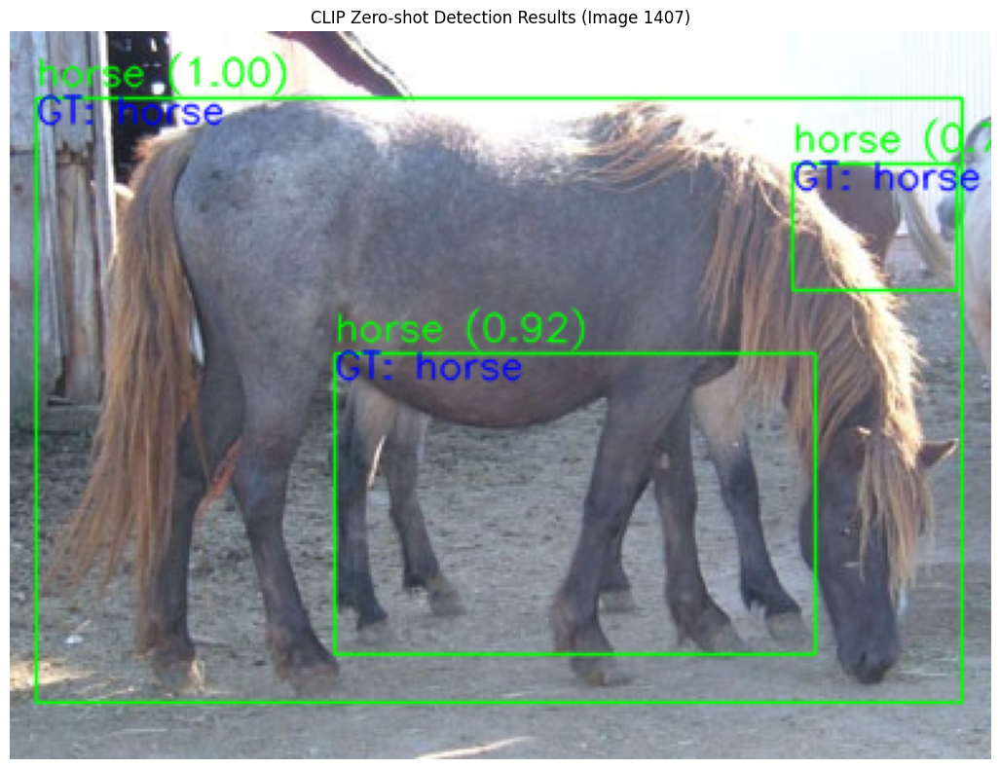

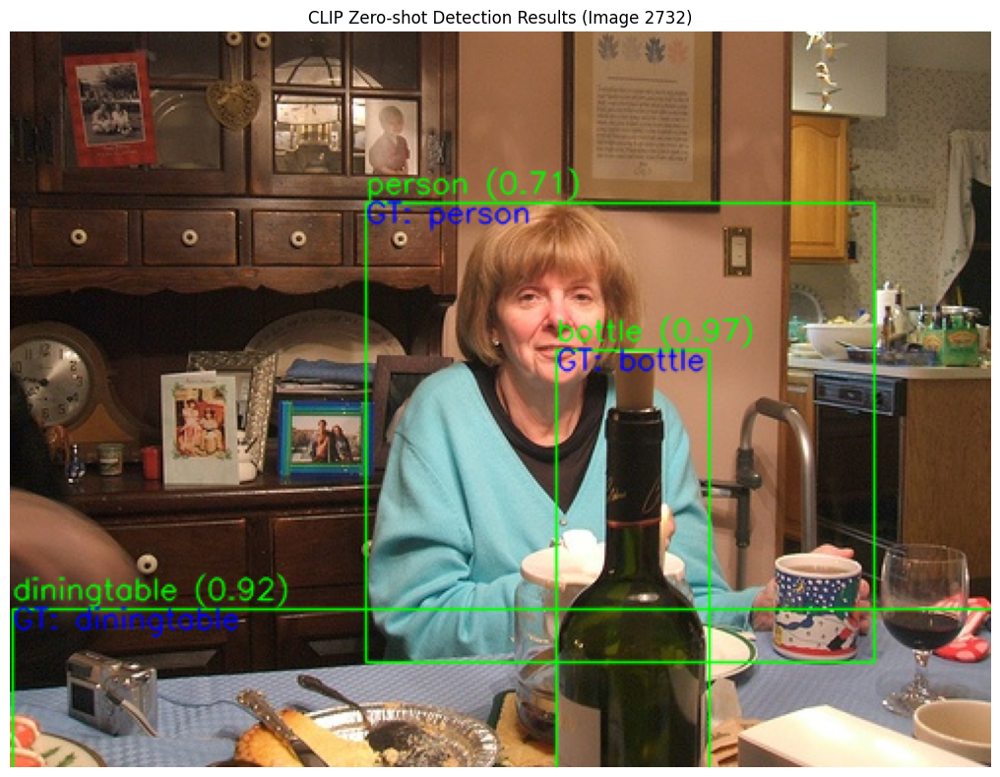

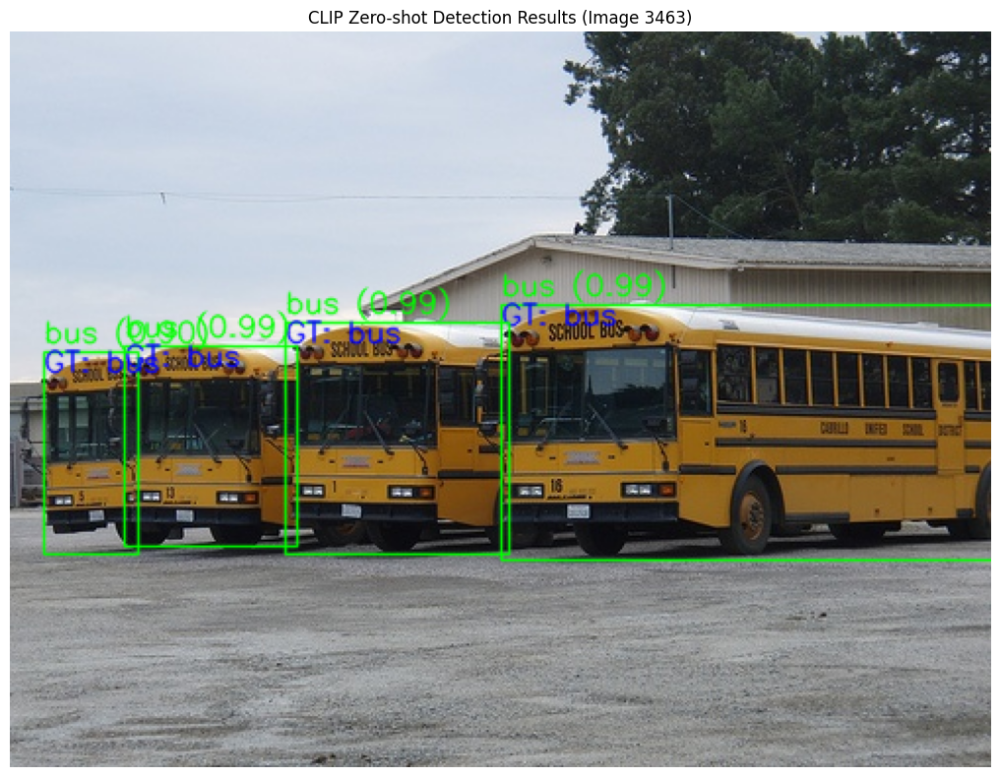

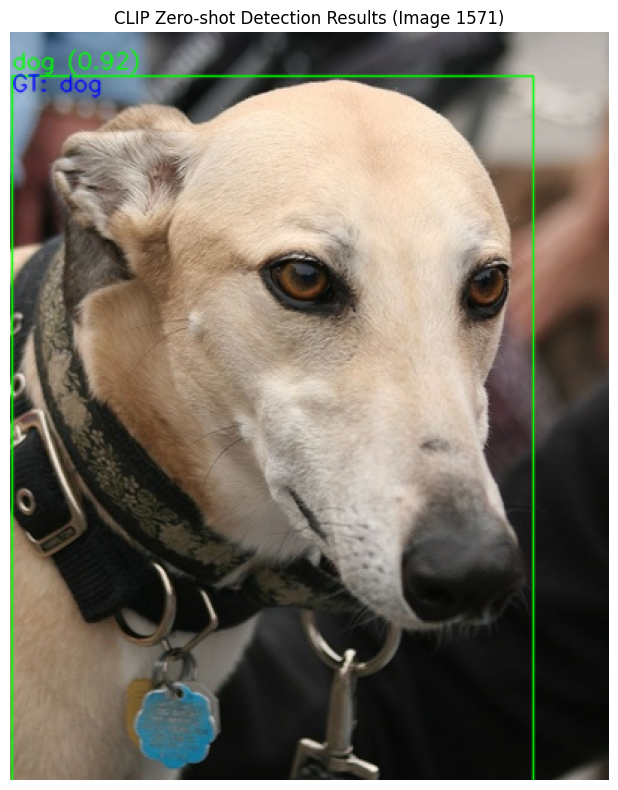

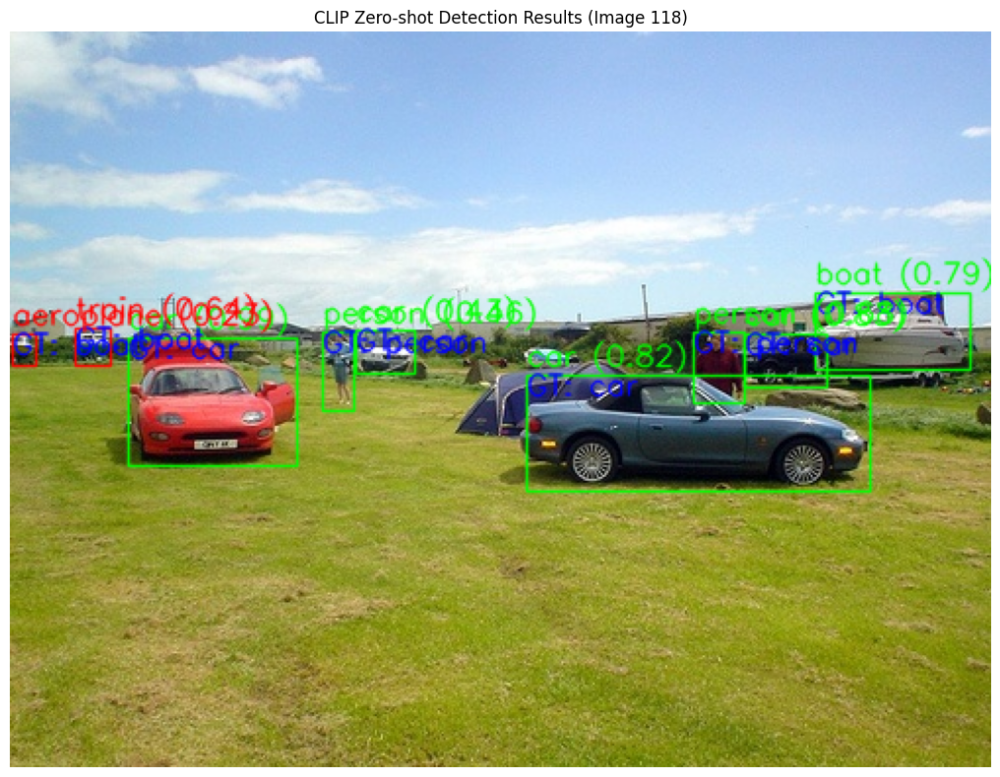

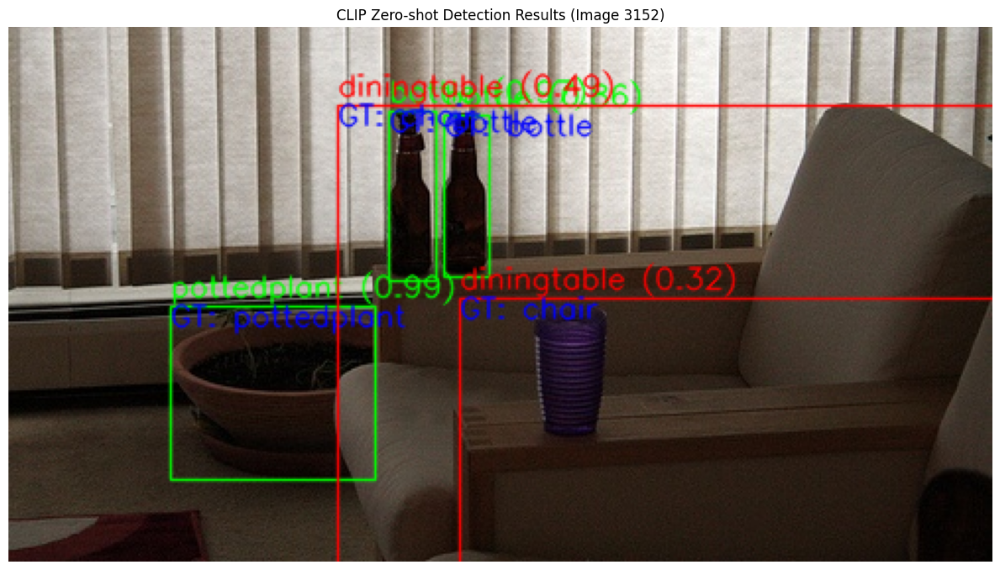

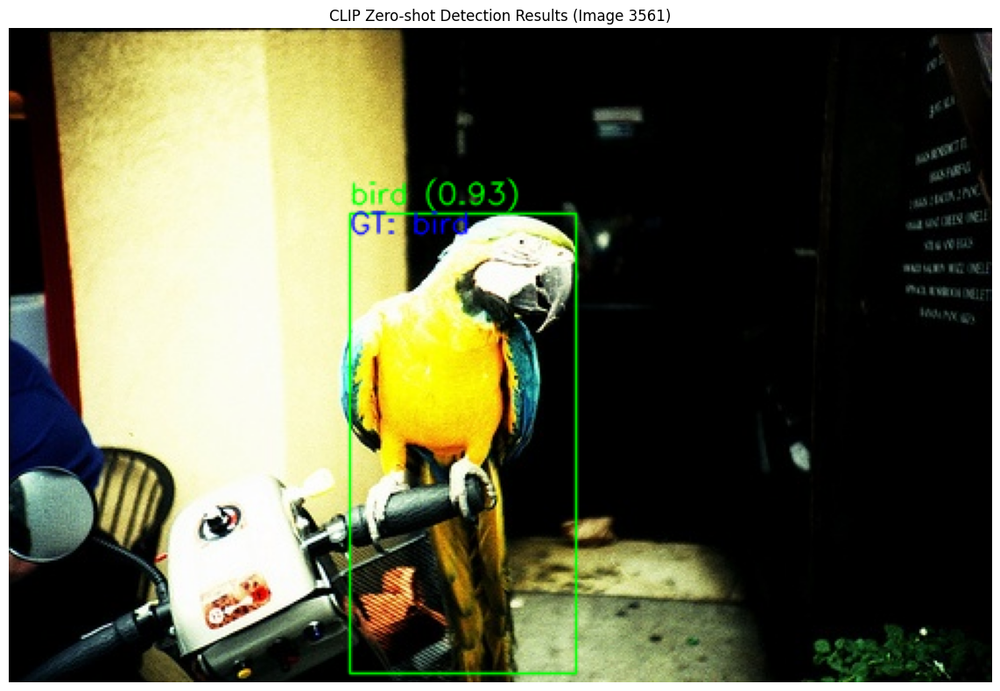

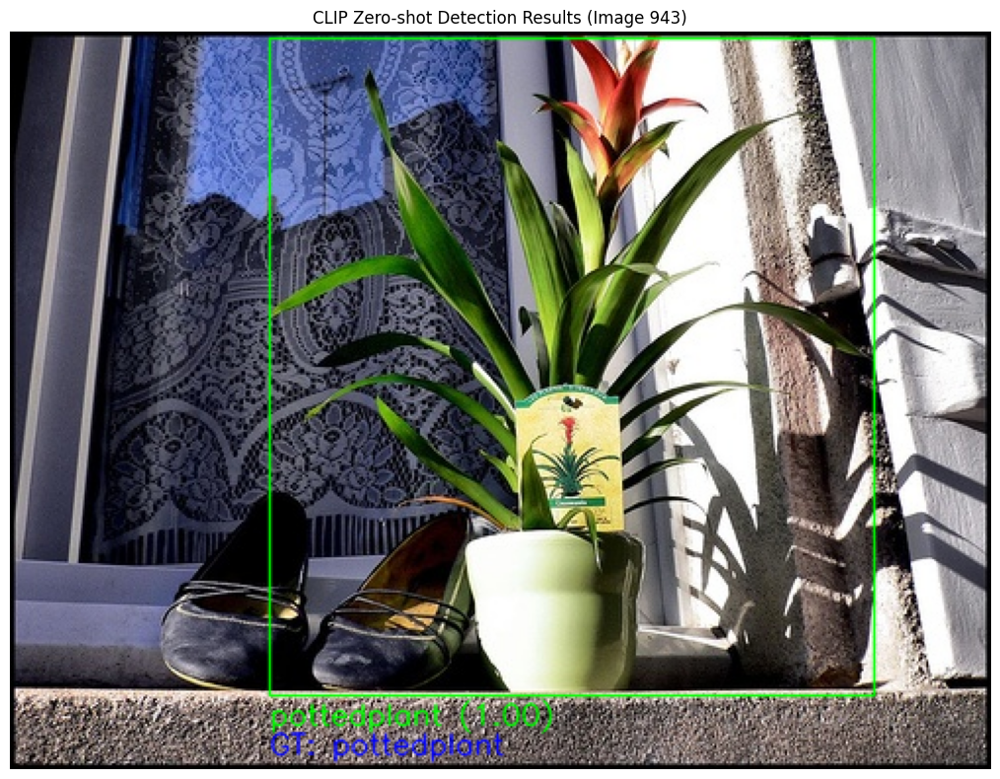

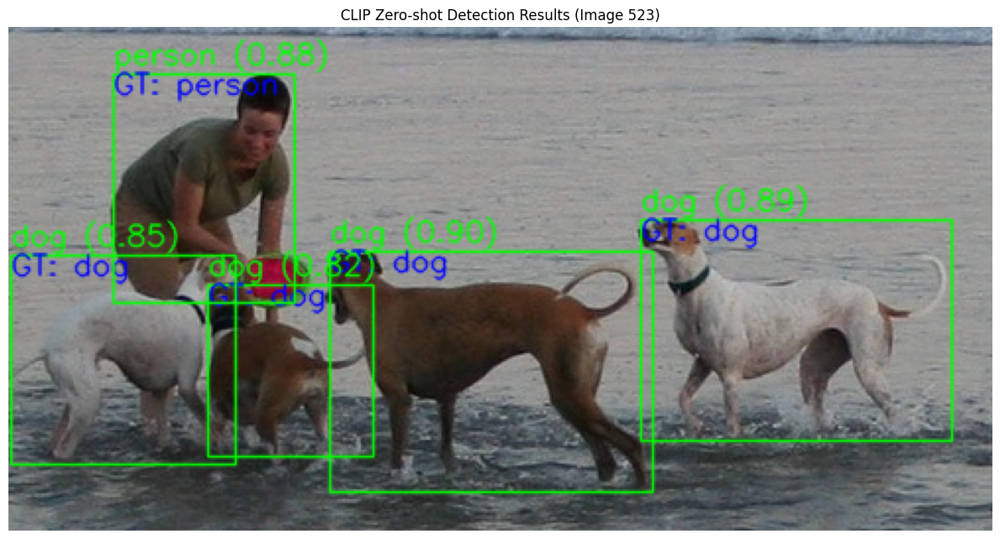

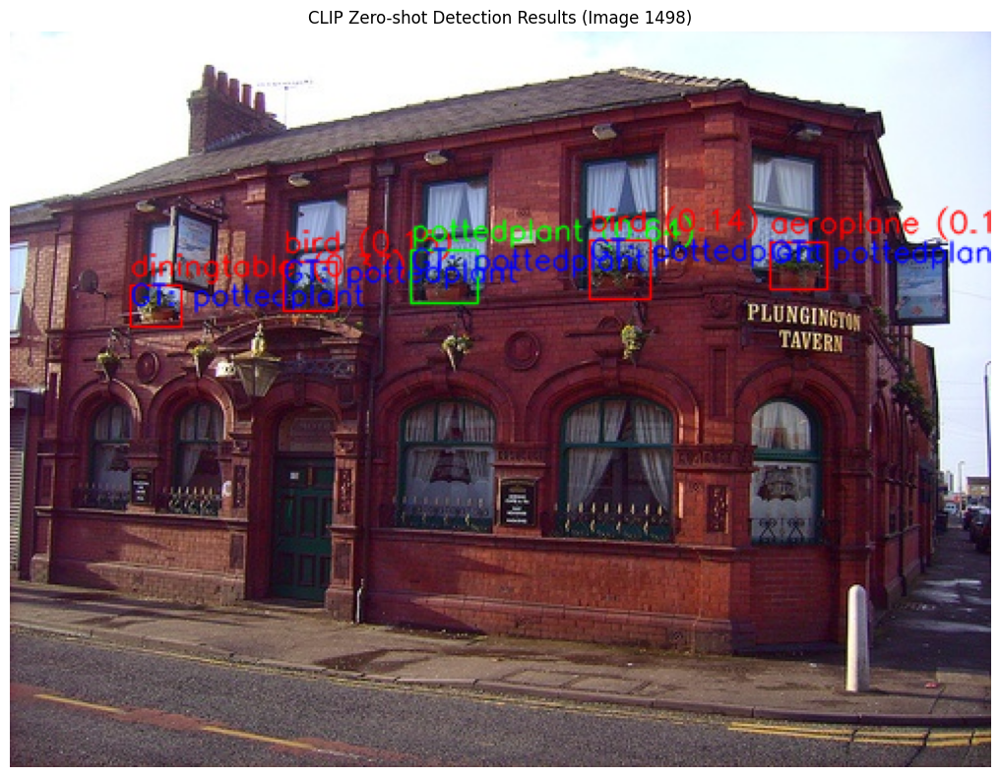

In [18]:
import os
import random
import cv2
import matplotlib.pyplot as plt

def visualize_results(sample_idx=0):
    """視覺化某一張圖像的結果（並自動 clamp 文字座標）"""
    sample = voc_test[sample_idx]
    image, annotation = sample

    # 圖片路徑
    img_id = annotation['annotation']['filename'].split('.')[0]
    img_path = os.path.join(root_dir, 'VOCdevkit/VOC2007/JPEGImages', f"{img_id}.jpg")

    # 取出真實標註與 CLIP 預測
    boxes, gt_labels = get_voc_annotations(sample)
    clip_results  = clip_zeroshot_detection(img_path, boxes)

    # 讀圖並轉成 RGB
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    # 畫框、文字參數
    rect_thickness = 1
    font_scale     = 0.5
    text_thickness = 1

    for i, result in enumerate(clip_results):
        # 解析資訊
        xmin, ymin, xmax, ymax = map(int, result['box'])
        pred_class = VOC_CLASS[result['predicted_class']]
        gt_class   = VOC_CLASS[gt_labels[i]]
        score      = result['score']
        label_txt  = f"{pred_class} ({score:.2f})"
        gt_txt     = f"GT: {gt_class}"

        # 1) 畫框
        cv2.rectangle(
            img,
            (xmin, ymin),
            (xmax, ymax),
            (0,255,0) if pred_class==gt_class else (255,0,0),
            rect_thickness,
            lineType=cv2.LINE_AA
        )

        # 2) 計算預測文字 y 座標
        #    嘗試畫在框頂上方：y_text = ymin - 10
        #    如果超出上界，改畫到框底下方（保持一行文字高度）
        y_text_pred = ymin - int(10 * font_scale)
        if y_text_pred < 0:
            y_text_pred = ymax + int(20 * font_scale) + 5

        # 3) 畫預測文字
        cv2.putText(
            img,
            label_txt,
            (xmin, y_text_pred),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            (0,255,0) if pred_class==gt_class else (255,0,0),
            text_thickness,
            lineType=cv2.LINE_AA
        )

        # 4) 計算真實文字 y 座標：在預測文字下面一行
        y_text_gt = y_text_pred + int(20 * font_scale) + 5
        # 如果超出下界，就 clamp 到影像底部
        if y_text_gt > h - 5:
            y_text_gt = h - 5

        # 5) 畫真實文字
        cv2.putText(
            img,
            gt_txt,
            (xmin, y_text_gt),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            (0,0,255),
            text_thickness,
            lineType=cv2.LINE_AA
        )

    # 顯示 & 儲存
    plt.figure(figsize=(12, 8))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"CLIP Zero-shot Detection Results (Image {sample_idx})")
    plt.tight_layout()
    plt.savefig(f'results_image_{sample_idx}.png', bbox_inches='tight')
    plt.show()

# 隨機挑 10 張做視覺化
for i in random.sample(range(len(voc_test)), 10):
    visualize_results(i)